In [1]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


In [2]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

steps = 10000
learning_rate = 0.003
betas = (0.5, 0.999)
content_image_path = '../data/style_transfer/content.png'
style_image_path = '../data/style_transfer/style2.png'
content_weight = 1
style_weight = 20000
PATH = '../data/saved_model/Style_transfer.pth'

In [3]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), 
                         std=(0.229, 0.224, 0.225))
])
denorm = transforms.Normalize((-2.12, -2.04, -1.80), (4.37, 4.46, 4.44))

def imshow(img):
    npimg = np.moveaxis(img.numpy(), 0, -1)
    plt.imshow(npimg)
    plt.show

In [4]:
# PNG has 4 channels
# https://stackoverflow.com/questions/44955656/how-to-convert-rgb-pil-image-to-numpy-array-with-3-channels
def load_image(image_path, img_size = None):
    image = Image.open(image_path).convert('RGB')
    if img_size is not None:
        image = image.resize((img_size[2], img_size[3]))
    image = transform(image)
    
    # Add batch dimension
    image = image.unsqueeze(0) 
    
    return image.to(device)

In [5]:
class squeezenet(nn.Module):
    def __init__(self, pool='max'):
        super(squeezenet, self).__init__()
        # squeezenet
        self.features = torchvision.models.squeezenet1_0(pretrained=True).features
        
        for param in self.features.parameters():
            param.requires_grad = False
        
    def forward(self, x):
        # Convolution layer : 0, 3, 4, 5, 7, 8, 9, 10, 12
        # https://discuss.pytorch.org/t/accessing-intermediate-layers-of-a-pretrained-network-forward/12113

        result = []
        for ii, layer in enumerate(self.features):
            x = layer(x)
            if ii in {0, 3, 4, 5, 7, 8, 9, 10, 12}:
                result.append(x)
        return result
    
net = squeezenet()
net.to(device).eval()

squeezenet(
  (features): Sequential(
    (0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(96, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): Fire(
   

In [6]:
# gram matrix 

class GramMatrix(nn.Module):
    def forward(self, x):
        b, c, h, w = x.size()
        F = x.view(b, c, h * w)
        G = torch.bmm(F, F.transpose(1, 2))
        G.div_(c * h * w)
        return G
GM = GramMatrix()

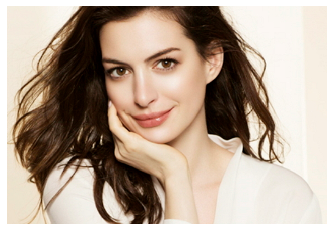

Content :  torch.Size([1, 3, 432, 635])


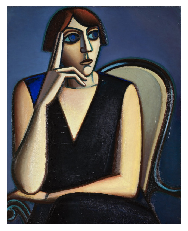

Style   :  torch.Size([1, 3, 800, 640])


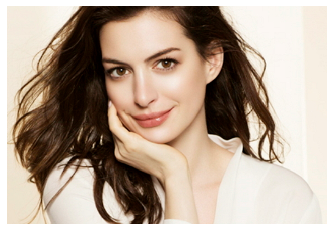

Target  :  torch.Size([1, 3, 432, 635])


In [7]:
content = load_image(content_image_path)

# fit style size to cotent size
style = load_image(style_image_path)


# Random Image

#target = torch.Tensor(content.size()).uniform_(0, 2).to(device) 

# Target Image 

target = content.clone().type(dtype=torch.FloatTensor).to(device)


target.requires_grad_()

plt.axis('off')
imshow(denorm(content.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()
print("Content : ", content.size())

plt.axis('off')
imshow(denorm(style.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()
print("Style   : ", style.size())


plt.axis('off')
imshow(denorm(target.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()
print("Target  : ", target.size())



In [8]:
optimizer = optim.Adam([target], lr=learning_rate, betas=betas)
content_criterion = nn.MSELoss()
style_criterion = nn.MSELoss()

"""
content = content.to(device)
style = style.to(device)
target = target.to(device)
"""


'\ncontent = content.to(device)\nstyle = style.to(device)\ntarget = target.to(device)\n'

Step [100/10000] : Content Loss : 0.9976212382316589, Style Loss : 1.8551900386810303


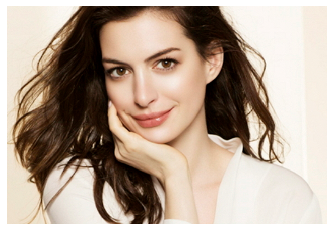

Step [200/10000] : Content Loss : 1.1966208219528198, Style Loss : 1.8113937377929688


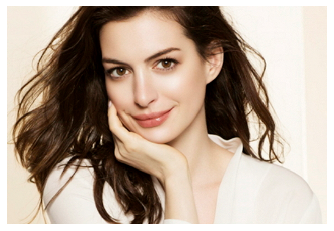

Step [300/10000] : Content Loss : 0.39255332946777344, Style Loss : 1.7976253032684326


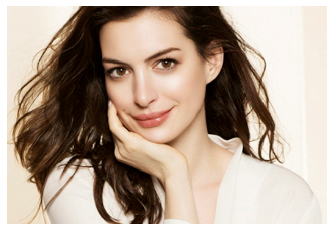

Step [400/10000] : Content Loss : 0.5962317585945129, Style Loss : 1.7695642709732056


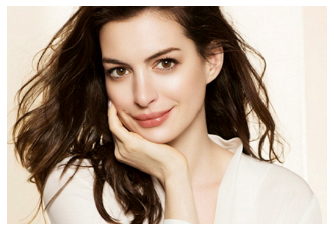

Step [500/10000] : Content Loss : 0.5066812038421631, Style Loss : 1.7655055522918701


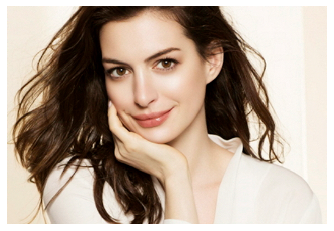

Step [600/10000] : Content Loss : 3.7434470653533936, Style Loss : 1.7373625040054321


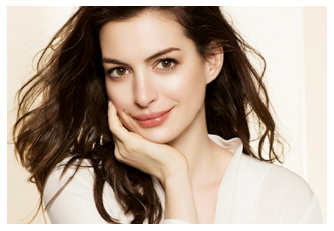

Step [700/10000] : Content Loss : 0.4895261824131012, Style Loss : 1.7421694993972778


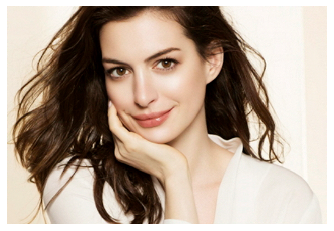

Step [800/10000] : Content Loss : 1.436186671257019, Style Loss : 1.734035611152649


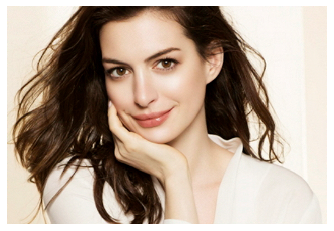

Step [900/10000] : Content Loss : 0.45176297426223755, Style Loss : 1.7323583364486694


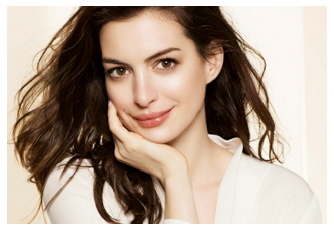

Step [1000/10000] : Content Loss : 2.3059449195861816, Style Loss : 1.712172508239746


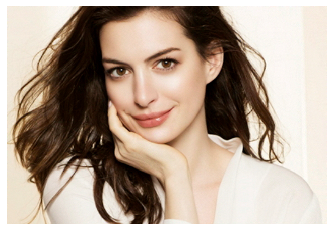

Step [1100/10000] : Content Loss : 0.44464802742004395, Style Loss : 1.7181442975997925


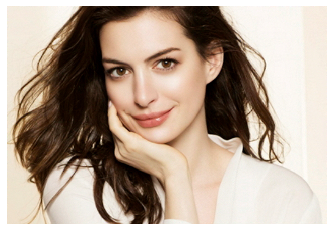

Step [1200/10000] : Content Loss : 1.7671420574188232, Style Loss : 1.7089344263076782


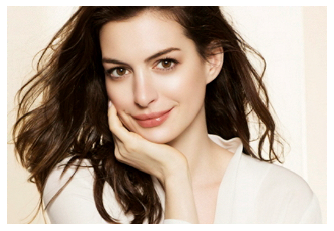

Step [1300/10000] : Content Loss : 0.7761002779006958, Style Loss : 1.697691798210144


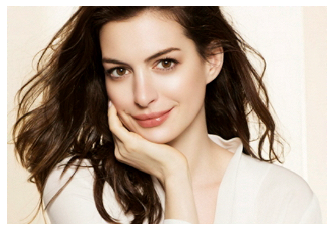

Step [1400/10000] : Content Loss : 0.4869842827320099, Style Loss : 1.7043296098709106


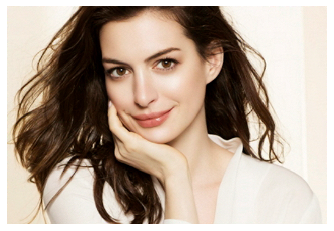

Step [1500/10000] : Content Loss : 1.1167900562286377, Style Loss : 1.6944913864135742


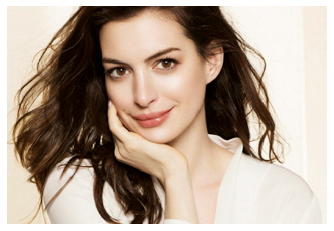

Step [1600/10000] : Content Loss : 0.9391103982925415, Style Loss : 1.6946989297866821


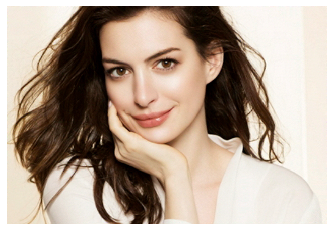

Step [1700/10000] : Content Loss : 0.4504013657569885, Style Loss : 1.6925873756408691


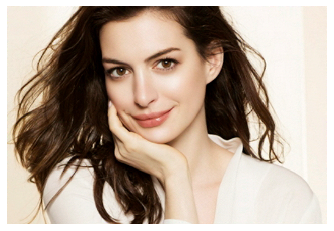

Step [1800/10000] : Content Loss : 0.7133393883705139, Style Loss : 1.6888850927352905


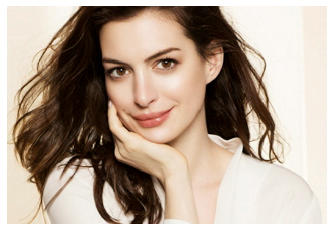

Step [1900/10000] : Content Loss : 0.8093554377555847, Style Loss : 1.679036021232605


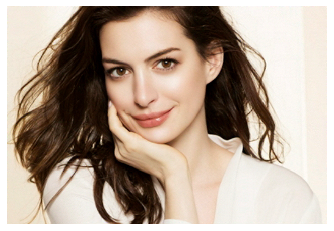

Step [2000/10000] : Content Loss : 1.1994937658309937, Style Loss : 1.6800458431243896


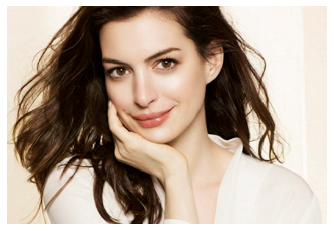

Step [2100/10000] : Content Loss : 0.5037131309509277, Style Loss : 1.6847087144851685


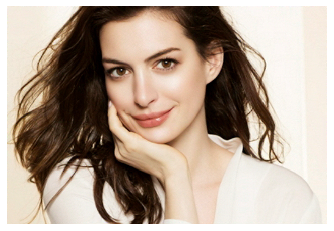

Step [2200/10000] : Content Loss : 1.3995431661605835, Style Loss : 1.6636641025543213


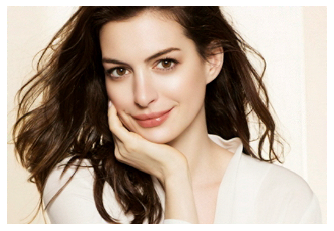

Step [2300/10000] : Content Loss : 1.0280567407608032, Style Loss : 1.664854645729065


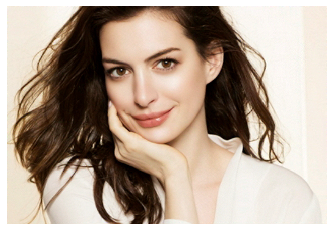

Step [2400/10000] : Content Loss : 0.4397198557853699, Style Loss : 1.6740201711654663


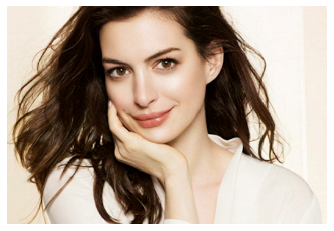

Step [2500/10000] : Content Loss : 0.5254616737365723, Style Loss : 1.6703381538391113


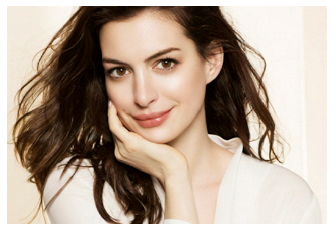

Step [2600/10000] : Content Loss : 1.070136308670044, Style Loss : 1.6663471460342407


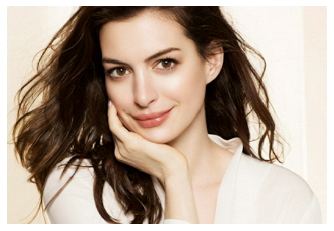

Step [2700/10000] : Content Loss : 0.6720422506332397, Style Loss : 1.659759759902954


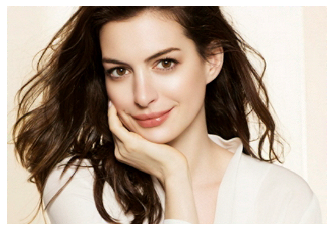

Step [2800/10000] : Content Loss : 0.600797712802887, Style Loss : 1.665666937828064


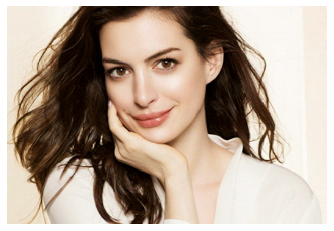

Step [2900/10000] : Content Loss : 0.5296990871429443, Style Loss : 1.662466049194336


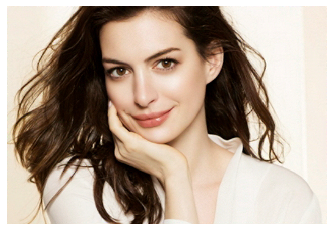

Step [3000/10000] : Content Loss : 0.79544597864151, Style Loss : 1.6534485816955566


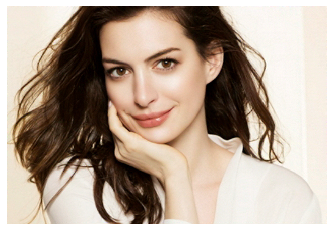

Step [3100/10000] : Content Loss : 0.7922462224960327, Style Loss : 1.658712387084961


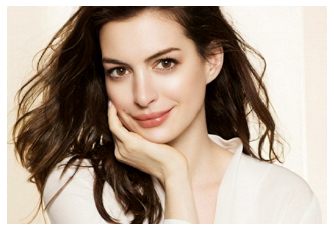

Step [3200/10000] : Content Loss : 1.6267434358596802, Style Loss : 1.6543251276016235


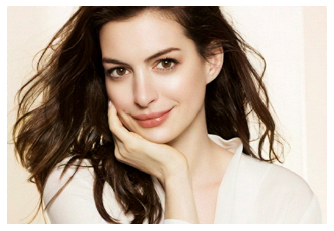

Step [3300/10000] : Content Loss : 1.0903539657592773, Style Loss : 1.6560063362121582


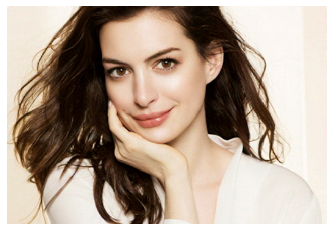

Step [3400/10000] : Content Loss : 2.6925313472747803, Style Loss : 1.6356979608535767


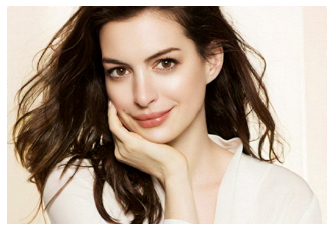

Step [3500/10000] : Content Loss : 0.838176965713501, Style Loss : 1.6536102294921875


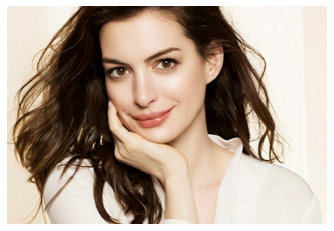

Step [3600/10000] : Content Loss : 0.38117021322250366, Style Loss : 1.6547832489013672


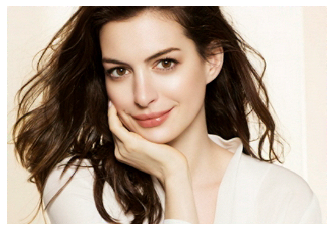

Step [3700/10000] : Content Loss : 3.0440306663513184, Style Loss : 1.635763168334961


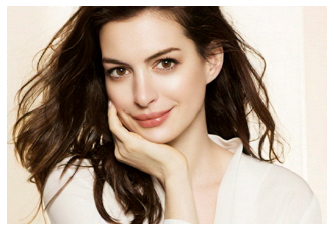

Step [3800/10000] : Content Loss : 0.5134111046791077, Style Loss : 1.6462393999099731


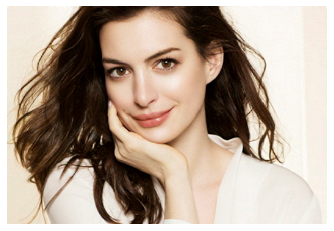

Step [3900/10000] : Content Loss : 2.224576473236084, Style Loss : 1.636029601097107


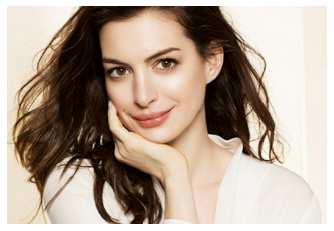

Step [4000/10000] : Content Loss : 1.7785277366638184, Style Loss : 1.6439944505691528


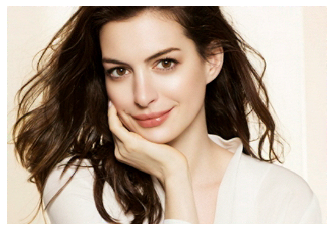

Step [4100/10000] : Content Loss : 0.5472987294197083, Style Loss : 1.6392320394515991


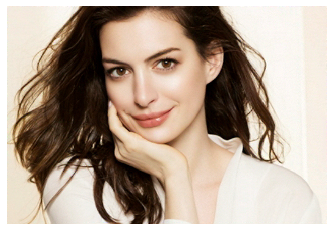

Step [4200/10000] : Content Loss : 0.7285126447677612, Style Loss : 1.6415866613388062


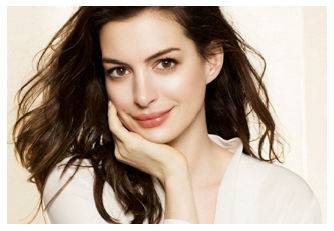

Step [4300/10000] : Content Loss : 1.3681961297988892, Style Loss : 1.638472557067871


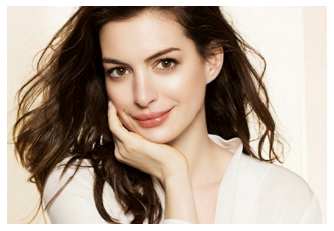

Step [4400/10000] : Content Loss : 0.5109049081802368, Style Loss : 1.6410109996795654


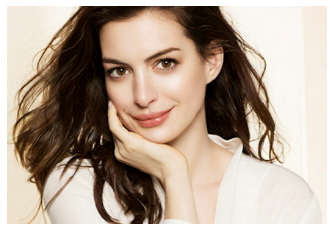

Step [4500/10000] : Content Loss : 0.45204272866249084, Style Loss : 1.6419095993041992


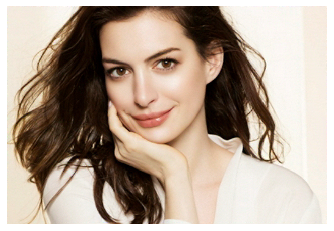

Step [4600/10000] : Content Loss : 1.0198818445205688, Style Loss : 1.6285104751586914


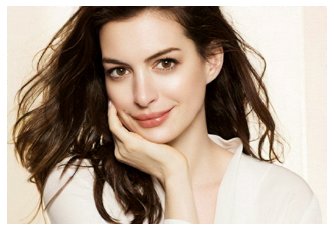

Step [4700/10000] : Content Loss : 0.3527348041534424, Style Loss : 1.6388139724731445


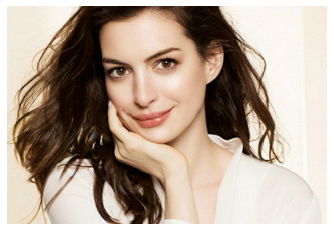

Step [4800/10000] : Content Loss : 0.7220028638839722, Style Loss : 1.631751537322998


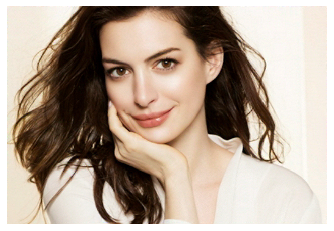

Step [4900/10000] : Content Loss : 0.9103133678436279, Style Loss : 1.631988763809204


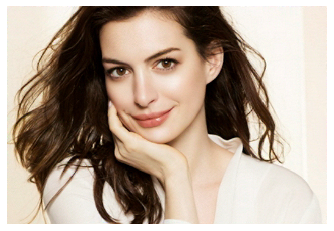

Step [5000/10000] : Content Loss : 0.7514371871948242, Style Loss : 1.6264954805374146


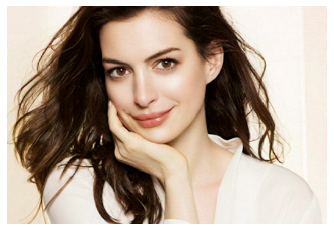

Step [5100/10000] : Content Loss : 0.5408298969268799, Style Loss : 1.6329336166381836


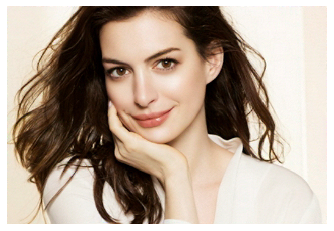

Step [5200/10000] : Content Loss : 1.1140393018722534, Style Loss : 1.62287175655365


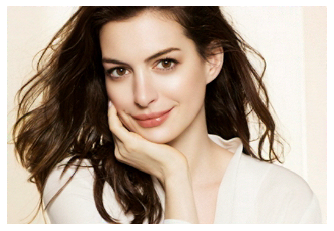

Step [5300/10000] : Content Loss : 0.4053950607776642, Style Loss : 1.6290316581726074


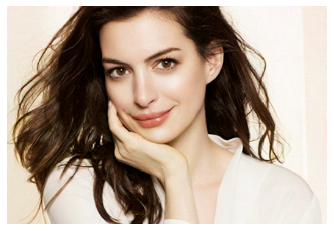

Step [5400/10000] : Content Loss : 0.39628008008003235, Style Loss : 1.6312196254730225


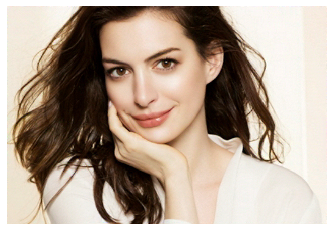

Step [5500/10000] : Content Loss : 3.6131930351257324, Style Loss : 1.6060304641723633


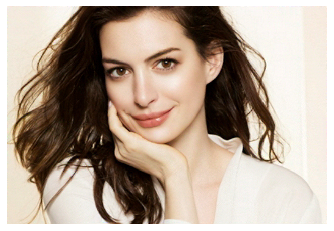

Step [5600/10000] : Content Loss : 0.6064272522926331, Style Loss : 1.6245065927505493


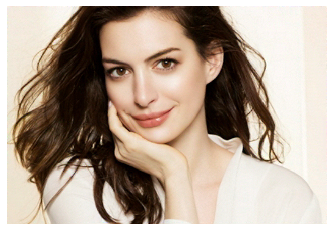

Step [5700/10000] : Content Loss : 0.42962032556533813, Style Loss : 1.630499005317688


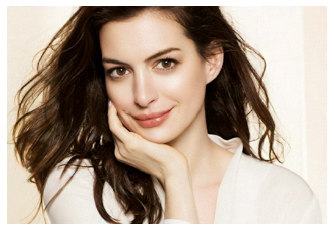

Step [5800/10000] : Content Loss : 0.43303412199020386, Style Loss : 1.6301747560501099


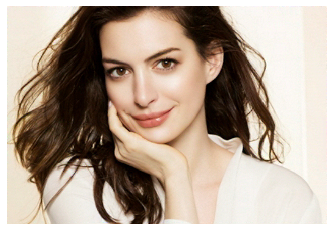

Step [5900/10000] : Content Loss : 1.1378592252731323, Style Loss : 1.6246027946472168


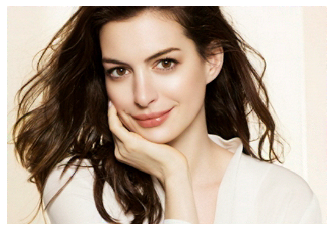

Step [6000/10000] : Content Loss : 1.606424331665039, Style Loss : 1.6111940145492554


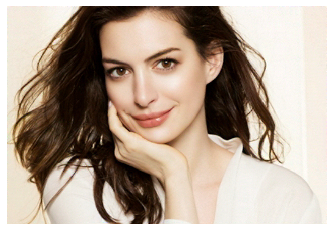

Step [6100/10000] : Content Loss : 0.5346267819404602, Style Loss : 1.6212576627731323


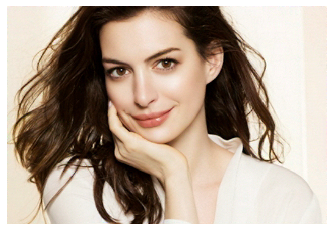

Step [6200/10000] : Content Loss : 1.0170806646347046, Style Loss : 1.6166434288024902


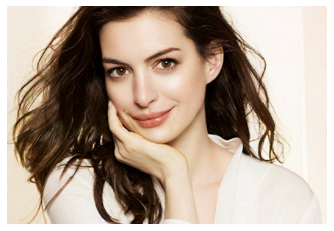

Step [6300/10000] : Content Loss : 1.535923719406128, Style Loss : 1.6168549060821533


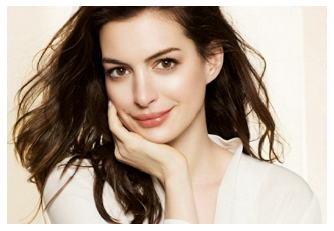

Step [6400/10000] : Content Loss : 1.1966124773025513, Style Loss : 1.6102986335754395


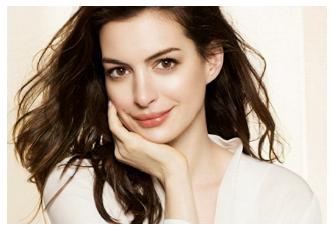

Step [6500/10000] : Content Loss : 0.437625914812088, Style Loss : 1.620503306388855


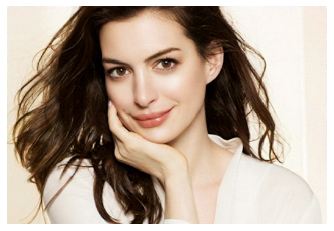

Step [6600/10000] : Content Loss : 0.4266979992389679, Style Loss : 1.6212352514266968


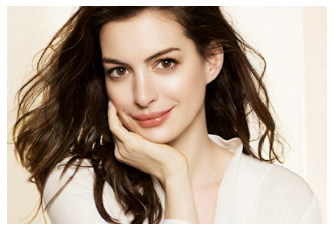

Step [6700/10000] : Content Loss : 3.7819745540618896, Style Loss : 1.599816918373108


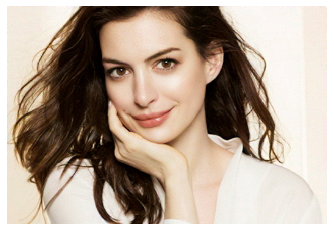

Step [6800/10000] : Content Loss : 1.0344353914260864, Style Loss : 1.6105815172195435


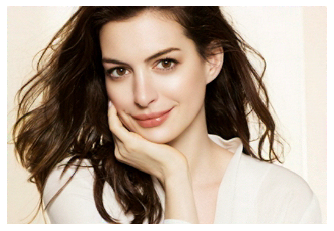

Step [6900/10000] : Content Loss : 0.9126664996147156, Style Loss : 1.6066803932189941


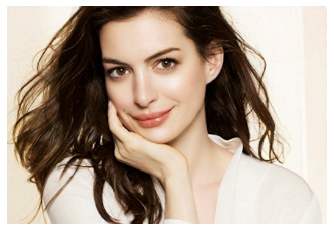

Step [7000/10000] : Content Loss : 0.4215110242366791, Style Loss : 1.6152876615524292


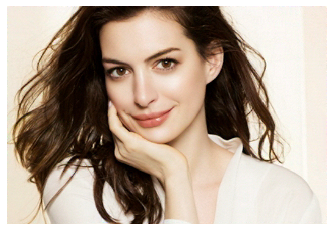

Step [7100/10000] : Content Loss : 1.3660645484924316, Style Loss : 1.612074851989746


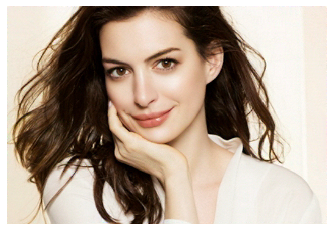

Step [7200/10000] : Content Loss : 1.1208072900772095, Style Loss : 1.6130104064941406


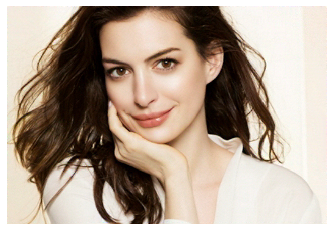

Step [7300/10000] : Content Loss : 1.5731340646743774, Style Loss : 1.600119709968567


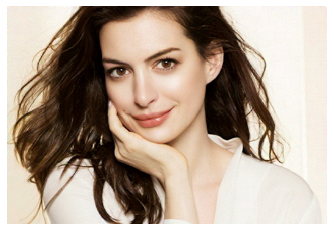

Step [7400/10000] : Content Loss : 0.6182083487510681, Style Loss : 1.6102447509765625


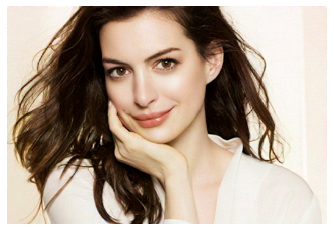

Step [7500/10000] : Content Loss : 0.4299638867378235, Style Loss : 1.614561915397644


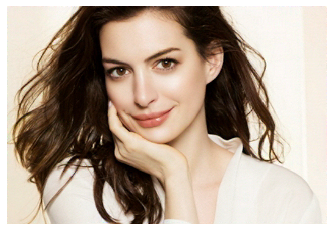

Step [7600/10000] : Content Loss : 1.2358208894729614, Style Loss : 1.5968025922775269


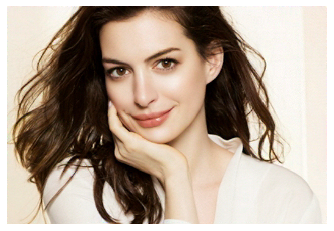

Step [7700/10000] : Content Loss : 0.861283540725708, Style Loss : 1.6026493310928345


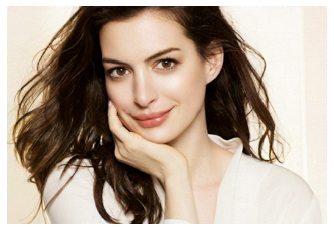

Step [7800/10000] : Content Loss : 0.9157689213752747, Style Loss : 1.607631802558899


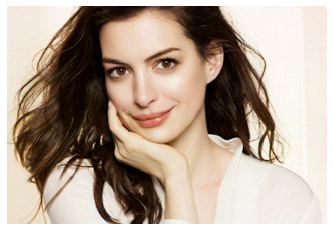

Step [7900/10000] : Content Loss : 1.1627113819122314, Style Loss : 1.606717586517334


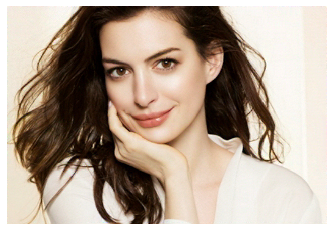

Step [8000/10000] : Content Loss : 2.9760971069335938, Style Loss : 1.5936204195022583


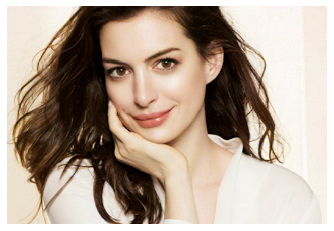

Step [8100/10000] : Content Loss : 1.1850793361663818, Style Loss : 1.5968040227890015


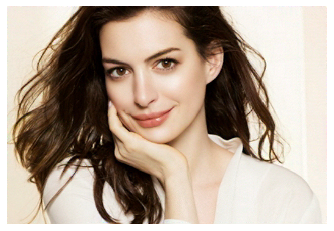

Step [8200/10000] : Content Loss : 0.4563656151294708, Style Loss : 1.6080771684646606


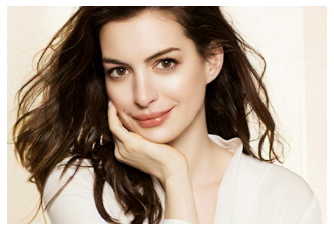

Step [8300/10000] : Content Loss : 0.6480350494384766, Style Loss : 1.6048529148101807


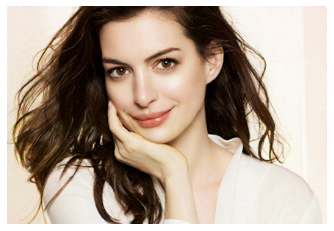

Step [8400/10000] : Content Loss : 1.7019879817962646, Style Loss : 1.5918822288513184


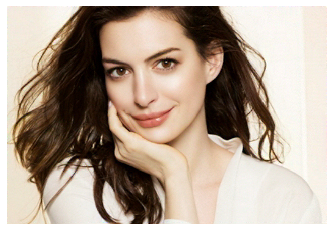

Step [8500/10000] : Content Loss : 0.43894344568252563, Style Loss : 1.6065291166305542


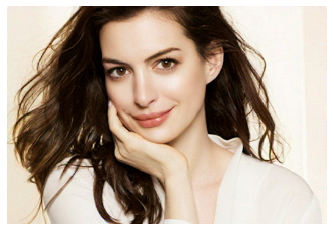

Step [8600/10000] : Content Loss : 1.1270160675048828, Style Loss : 1.6049481630325317


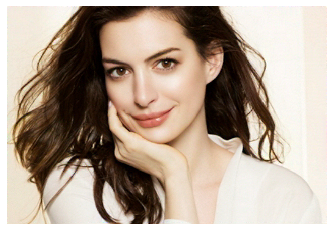

Step [8700/10000] : Content Loss : 0.4209655523300171, Style Loss : 1.6071003675460815


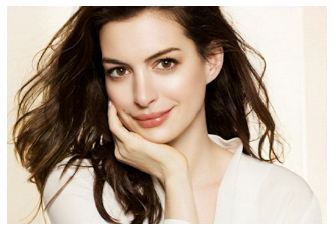

Step [8800/10000] : Content Loss : 0.8525189161300659, Style Loss : 1.6026670932769775


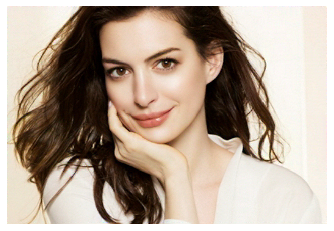

Step [8900/10000] : Content Loss : 1.4334262609481812, Style Loss : 1.5874073505401611


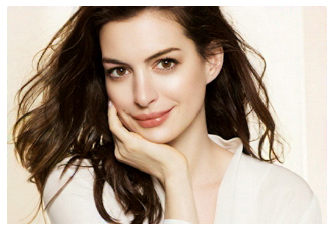

Step [9000/10000] : Content Loss : 0.4863469898700714, Style Loss : 1.6038026809692383


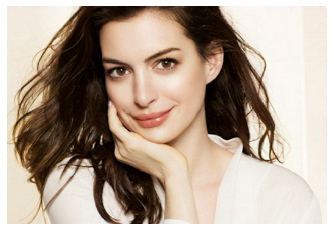

Step [9100/10000] : Content Loss : 1.874355435371399, Style Loss : 1.5922199487686157


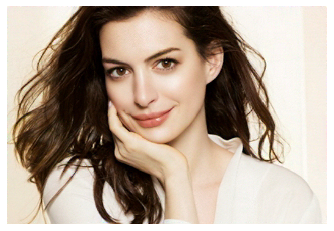

Step [9200/10000] : Content Loss : 0.8577704429626465, Style Loss : 1.5974149703979492


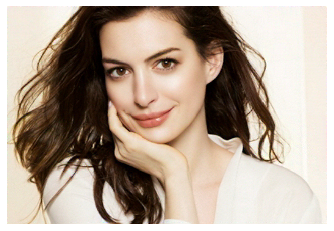

Step [9300/10000] : Content Loss : 0.3907187283039093, Style Loss : 1.6032812595367432


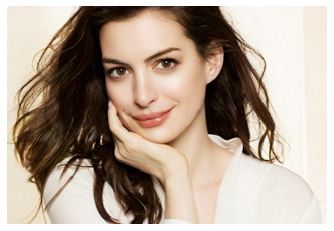

Step [9400/10000] : Content Loss : 2.9014892578125, Style Loss : 1.5806804895401


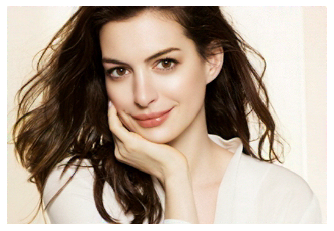

Step [9500/10000] : Content Loss : 0.995740532875061, Style Loss : 1.5890253782272339


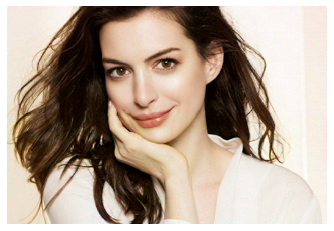

Step [9600/10000] : Content Loss : 0.42466703057289124, Style Loss : 1.6021978855133057


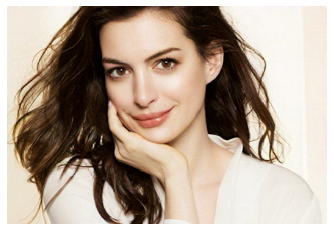

Step [9700/10000] : Content Loss : 1.5386486053466797, Style Loss : 1.593735933303833


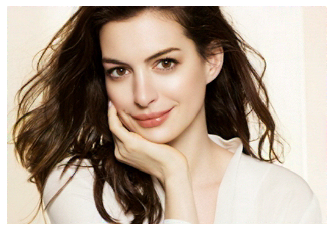

Step [9800/10000] : Content Loss : 0.781684160232544, Style Loss : 1.5917600393295288


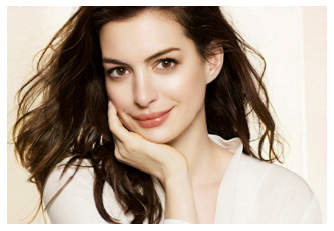

Step [9900/10000] : Content Loss : 0.7391304969787598, Style Loss : 1.5981659889221191


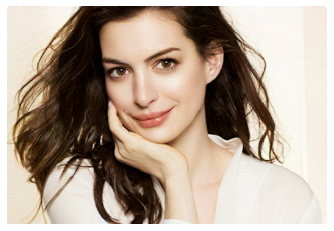

Step [10000/10000] : Content Loss : 0.9457520246505737, Style Loss : 1.5892277956008911


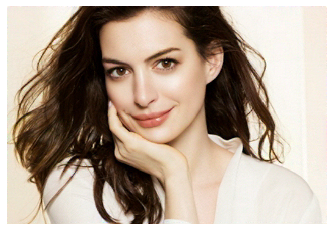

In [10]:
all_content_loss = []
all_style_loss = []

for step in range(steps):
    
    content_features = net(content)
    style_features = net(style)
    target_features = net(target)
    
    # Convolution layer : 0, 3, 4, 5, 7, 8, 9, 10, 12
    # We wanna use #9 at style 
    style_layer = 1
    
    content_loss = 0.
    style_loss = 0.
    
    # content loss
    for C, T in zip(content_features, target_features):
        content_loss += content_criterion(C, T) * content_weight
    
    # style loss
    S = GM(style_features[style_layer].clone())
    T = GM(target_features[style_layer].clone())
    style_loss += torch.mean((S - T) ** 2) * style_weight
    
    # tv_loss
    #tv_loss = 0.05 * (torch.sum(torch.pow(target[:, :, 1:, :] - target[:, :, :-1, :], 2)) + torch.sum(torch.pow(target[:, :, :, 1:] - target[:, :, :, :-1], 2)))
    
    
    all_content_loss.append(content_loss)
    all_style_loss.append(style_loss)
    
    loss = content_loss + style_loss #+ tv_loss
    optimizer.zero_grad()


    loss.backward()

    optimizer.step()
    
    if (step + 1) % 100 == 0:
        print("Step [{now}/{total}] : Content Loss : {content_loss}, Style Loss : {style_loss}".format(now=step + 1, total=steps, content_loss=content_loss.item(), style_loss=style_loss.item()))


        
        plt.axis('off')
        mid_img = denorm(target.cpu().detach().clone().squeeze()).clamp_(0, 1)
        imshow(mid_img)
        plt.show()


In [ ]:
plt.figure()
fig, axs = plt.subplots(2, figsize=(20, 5))

axs[0].plot(all_content_loss)
axs[0].set_title("all_content_loss")

axs[1].plot(all_style_loss)
axs[1].set_title("all_style_loss")



In [ ]:
# Result


plt.axis('off')
imshow(denorm(content.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()

plt.axis('off')
imshow(denorm(style.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()


plt.axis('off')
imshow(denorm(target.clone().cpu().detach().squeeze()).clamp_(0, 1))
plt.show()




In [ ]:
from torchvision.utils import save_image

img = denorm(target.clone().cpu().detach().squeeze()).clamp_(0, 1)
# img1 = img1.numpy() # TypeError: tensor or list of tensors expected, got <class 'numpy.ndarray'>
save_image(img, '../data/style_transfer/output-{}.png'.format(step+1))